# k-NN graph

Boundary nodes
* Do we see the existence of boundary nodes? That is nodes that have a proportion of k-NN outside their community? What is the distribution that proportion overall nodes? If there are boundary nodes, are we able to identify them - with a classifier for instance.

Triads
* We know some cliques are being separated by the ground truth partition, what about the triad types? Are some type more preserved than others?

In [92]:
!git branch

* main


In [2]:
execfile('functions/data_specifics.py')
execfile('functions/graph_functions.py')
print(data_set_list)

['pendigits', 'coil', 'mnist', 'usps', 'buildings', 'clusterable']


In [3]:
from IPython.display import display, Markdown, Latex
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score, silhouette_score

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import hdbscan
import umap
from sklearn.neighbors import KNeighborsTransformer
import pynndescent
from scipy.spatial.distance import euclidean

import cdlib.algorithms as cd
import itertools
import collections
import igraph as ig
import leidenalg as la

from community import community_louvain

sns.set()

Note: to be able to use all crisp methods, you need to install some additional packages:  {'karateclub', 'graph_tool', 'wurlitzer', 'infomap'}
Note: to be able to use all overlapping methods, you need to install some additional packages:  {'karateclub', 'ASLPAw'}
Note: to be able to use all bipartite methods, you need to install some additional packages:  {'wurlitzer', 'infomap'}


# Triads

### How to refer to the different triads
    * 003 -- the empty graph
    * 012 -- a graph with a single directed edge (A --> B, C)
    * 102 -- a graph with a single mutual edge (A <-> B, C)
    * 021D -- the binary out-tree (A <-- B --> C)
    * 021U -- the binary in-tree (A --> B <-- C)
    * 021C -- the directed line (A --> B --> C)
    * 111D -- A <-> B <-- C
    * 111U -- A <-> B --> C
    * 030T -- A --> B <-- C, A --> C
    * 030C -- A <-- B <-- C, A --> C
    * 201 -- A <-> B <-> C
    * 120D -- A <-- B --> C, A <-> C
    * 120U -- A --> B <-- C, A <-> C
    * 120C -- A --> B --> C, A <-> C
    * 210C -- A --> B <-> C, A <-> C
    * 300 -- the complete graph (A <-> B <-> C, A <-> C)

In [ ]:
triad_types = {}
triad_types['003'] = 0
triad_types['012'] = 1
triad_types['102'] = 2
triad_types['021D'] = 3
triad_types['021U'] = 4
triad_types['021C'] = 5
triad_types['111D'] = 6
triad_types['111U'] = 7
triad_types['030T'] = 8
triad_types['030C'] = 9
triad_types['210'] = 10
triad_types['120D'] = 11
triad_types['120U'] = 12
triad_types['120C'] = 13
triad_types['210C'] = 14
triad_types['300'] = 15

In [58]:
def profile_triad(dataset_id, triads_triangles):
    params = get_dataset_params(dataset_id)
    raw_data, targets, dataset_name = get_dataset(dataset_id)
    display(Markdown(f'## {dataset_name}'))
    
    G = knn_digraph(raw_data, params['n_neighbors'])
    G = graph_edge_class_from_labels(G, targets, attribute_name = 'internal')
    ec = la.find_partition(G, la.ModularityVertexPartition)
    clustering_labels = np.array(ec.membership)
    G = graph_edge_class_from_labels(G, clustering_labels, attribute_name = 'leiden_internal')
    
    graphs = {}
    graphs['All'] = G
    G_sub_internal=G.copy()
    G_sub_internal.delete_edges(G_sub_internal.es.select(internal_eq=False))
    graphs['Ground Truth'] = G_sub_internal
    G_sub_leiden=G.copy()
    G_sub_leiden.delete_edges(G_sub_leiden.es.select(leiden_internal_eq=False))
    graphs['Leiden'] = G_sub_leiden

    res = []
    for k, v in graphs.items():
        triad = v.triad_census()
        for x in triads_triangles:
            res.append([k,x, triad[triad_types[x]]]) 
    df_triad = pd.DataFrame(res, columns=['Graph', 'Triad type', 'Count'])

    sns.barplot(df_triad, x='Triad type', y='Count', hue='Graph')
    plt.show()
    return()

## pendigits

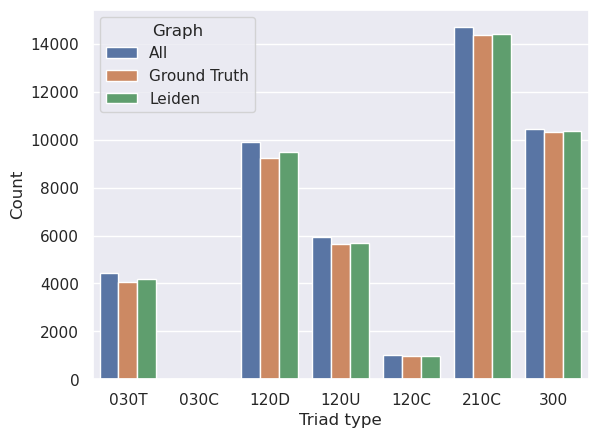

## coil

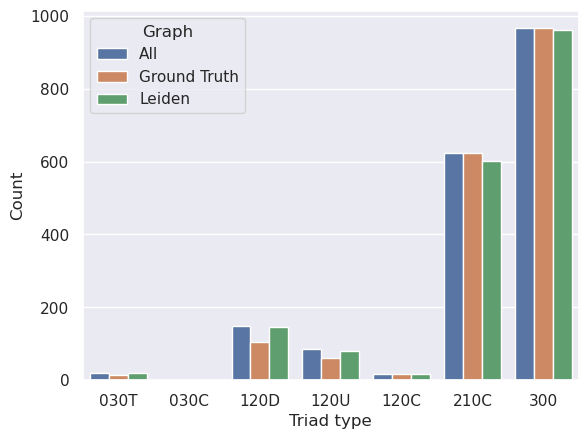

## mnist

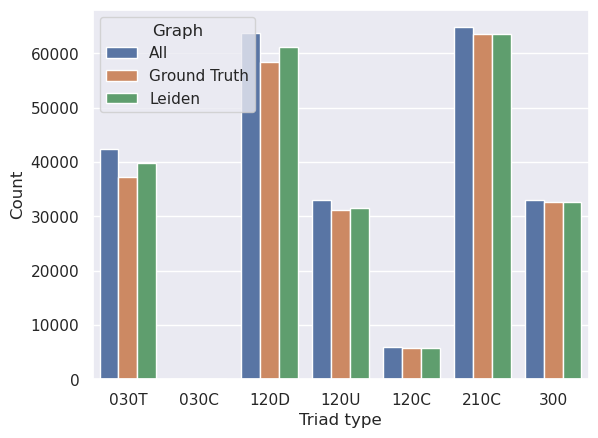

## usps

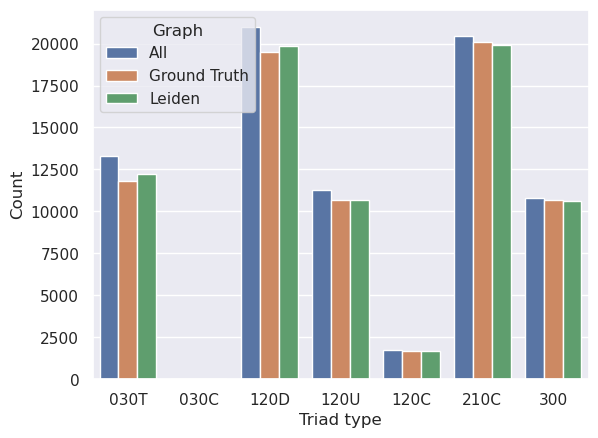

## buildings

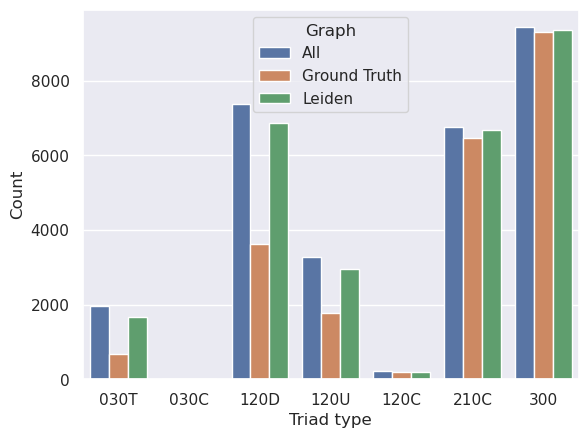

## clusterable

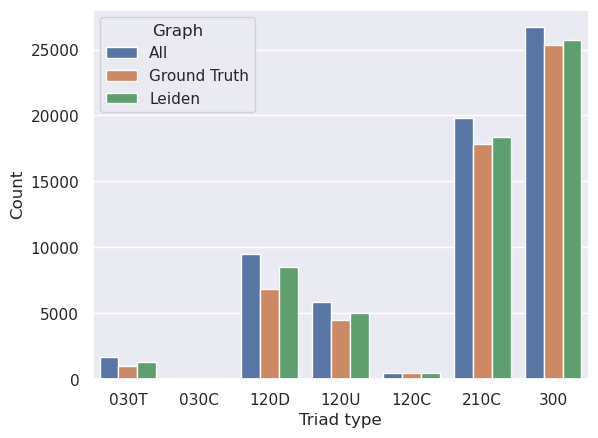

In [59]:
triads_triangles = ['030T', '030C', '120D', '120U', '120C', '210C', '300']
for i in range(6):
    profile_triad(dataset_id=i, triads_triangles)

# Boundary nodes?

In [236]:
dataset_id=0
params = get_dataset_params(dataset_id)
raw_data, targets, dataset_name = get_dataset(dataset_id)
display(Markdown(f'## {dataset_name}, k={params["n_neighbors"]}'))

G = knn_digraph(raw_data, params['n_neighbors'])
G = graph_edge_class_from_labels(G, targets, attribute_name = 'internal')

G_sub_internal=G.copy()
G_sub_internal.delete_edges(G_sub_internal.es.select(internal_eq=False))

x = G.transitivity_local_undirected()
y = G_sub_internal.outdegree()
# plt.hist2d(x, y)

## pendigits, k=15

(array([ 15., 149., 398., 472., 384., 205., 109.,  44.,  16.,   5.]),
 array([0.15076923, 0.228     , 0.30523077, 0.38246154, 0.45969231,
        0.53692308, 0.61415385, 0.69138462, 0.76861538, 0.84584615,
        0.92307692]),
 <BarContainer object of 10 artists>)

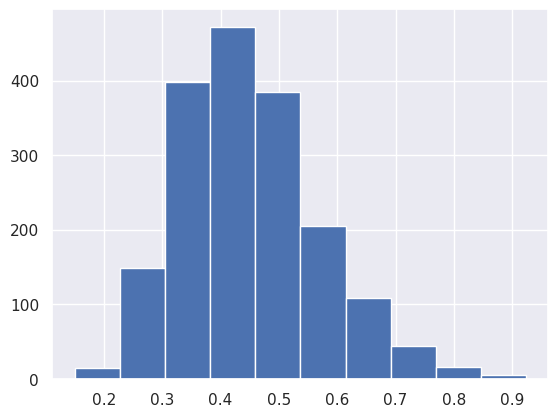

In [101]:
plt.hist(x)

In [192]:
sns.color_palette("tab10")

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [193]:
targets

array([0, 1, 2, ..., 8, 9, 8])

In [138]:
new_col = sns.color_palette("Blues")[0]

In [213]:
import random
random.seed(0)
layout = G.layout("drl")
vertex_color = [sns.color_palette("tab10")[i] for i in targets]
vertex_col_list = vertex_color

ig.plot(G,
       layout=layout, 
        vertex_color=vertex_col_list,
        edge_width=0.1,
        edge_arrow_size=0)

In [214]:
w = (np.array(x)>0.4)
vertex_col_list = [tuple(v) if w[i] else new_col for i, v in enumerate(np.array(vertex_color))]

In [215]:
G_sub = G.copy()
G_sub.delete_vertices(np.where(np.invert(w))[0].tolist())

In [218]:
import random
random.seed(0)
layout = G_sub.layout("drl")
vertex_color = [sns.color_palette("tab10")[i] for i in targets[w]]
vertex_col_list = vertex_color

ig.plot(G_sub,
       layout=layout, 
        vertex_color=vertex_col_list,
        edge_width=0.1,
        edge_arrow_size=0)

(array([[  0.,   0.,   1., 182.,   5.,   0.,   0., 179.,   2.,  12.],
        [  0.,   0.,   0.,   1.,   0., 179.,   0.,   0.,   0.,   2.],
        [  0.,   0.,   0.,   0.,   0.,   1., 180.,   0.,   0.,   0.],
        [178.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   9.,   0.,   0.,   0.,   1.,   0., 164.,   2.],
        [  0.,   0.,   0.,   0., 176.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0., 167.,   0.,   0.,   0.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   0.,   2.,   0.,   0.,   1., 144.],
        [  0.,  97.,   0.,   0.,   0.,   0.,   0.,   0.,   5.,   0.],
        [  0.,  85.,   0.,   0.,   0.,   0.,   0.,   0.,   2.,  20.]]),
 array([ 0. ,  1.1,  2.2,  3.3,  4.4,  5.5,  6.6,  7.7,  8.8,  9.9, 11. ]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <matplotlib.collections.QuadMesh at 0x7f8b67d8e750>)

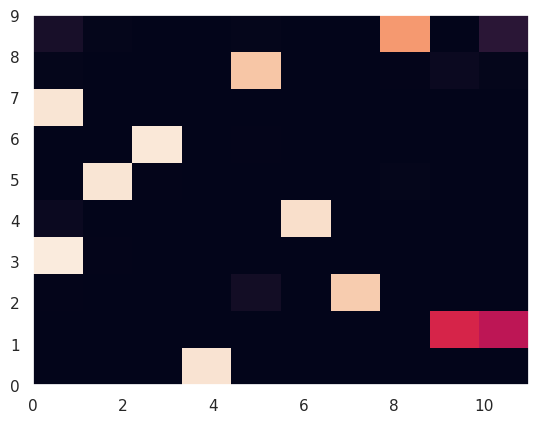

In [237]:
leiden = la.find_partition(G, la.ModularityVertexPartition)
plt.hist2d(leiden.membership, targets)

(array([[ 83.,  73.,   0.,   0.,   0.,   0.,  78.,   0.,   1.,   0.],
        [  0.,   0.,  71.,   0.,   0.,   1.,   0.,   0.,   0.,  68.],
        [  0.,   0.,   0.,   0.,  67.,  68.,   0.,   0.,   0.,   0.],
        [  0.,   0.,   0.,   0.,   1.,   0.,   0., 105.,   0.,   6.],
        [  0.,  55.,   0.,   0.,  50.,   0.,   0.,   0.,   1.,   0.],
        [  0.,   0.,   0.,  47.,   0.,  45.,  48.,   0.,   0.,   1.],
        [  0.,   0.,  38.,  32.,   0.,   0.,   0.,   0.,  13.,   0.],
        [  0.,   0.,   8.,   9.,   0.,   0.,   0.,   0.,  47.,   0.],
        [  0.,  27.,   0.,   0.,   0.,   0.,   0.,  26.,   0.,   0.],
        [  0.,   0.,   0.,   0.,  25.,   0.,   0.,   0.,   1.,  18.]]),
 array([ 0. ,  2.2,  4.4,  6.6,  8.8, 11. , 13.2, 15.4, 17.6, 19.8, 22. ]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <matplotlib.collections.QuadMesh at 0x7f8b67d92c10>)

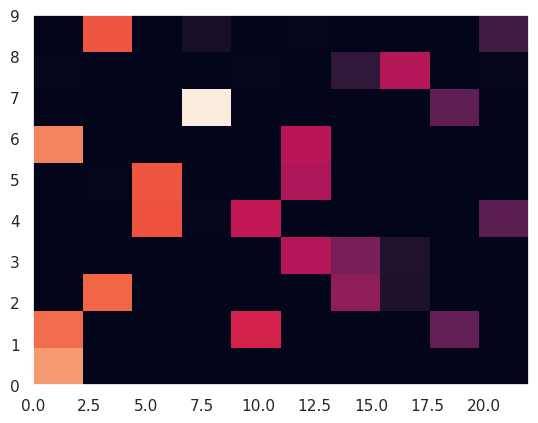

In [222]:
leiden = la.find_partition(G_sub, la.ModularityVertexPartition)
plt.hist2d(leiden.membership, targets[w])

In [89]:
def internal_degree(dataset_id):
    params = get_dataset_params(dataset_id)
    raw_data, targets, dataset_name = get_dataset(dataset_id)
    display(Markdown(f'## {dataset_name}, k={params["n_neighbors"]}'))

    G = knn_digraph(raw_data, params['n_neighbors'])
    G = graph_edge_class_from_labels(G, targets, attribute_name = 'internal')

    G_sub_internal=G.copy()
    G_sub_internal.delete_edges(G_sub_internal.es.select(internal_eq=False))

    sns.histplot(G_sub_internal.outdegree(), discrete=True, bins=range(params['n_neighbors']))
    plt.show()
    return()

In [230]:
def correlation_hist(dataset_id):
    params = get_dataset_params(dataset_id)
    raw_data, targets, dataset_name = get_dataset(dataset_id)
    display(Markdown(f'## {dataset_name}, k={params["n_neighbors"]}'))

    G = knn_digraph(raw_data, params['n_neighbors'])
    G = graph_edge_class_from_labels(G, targets, attribute_name = 'internal')

    leiden = la.find_partition(G, la.ModularityVertexPartition)
    w= np.array(targets>=0)
    plt.hist2d(np.array(leiden.membership)[w], np.array(targets)[w])
    plt.show()
    return()

In [235]:
len(targets)

1797

In [238]:
df = pd.DataFrame({'Ground Truth':targets, 'Leiden':leiden.membership})

<AxesSubplot:>

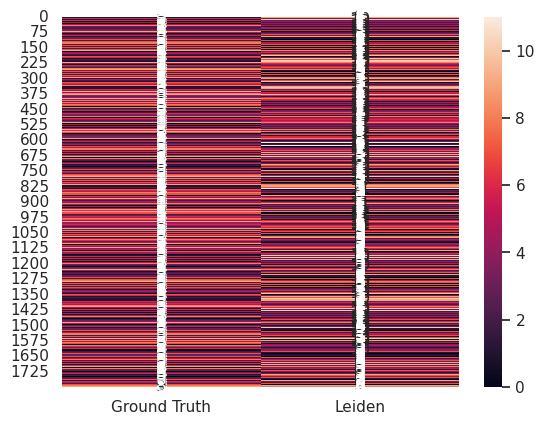

In [239]:
sns.heatmap(df, annot=True)

## pendigits, k=15

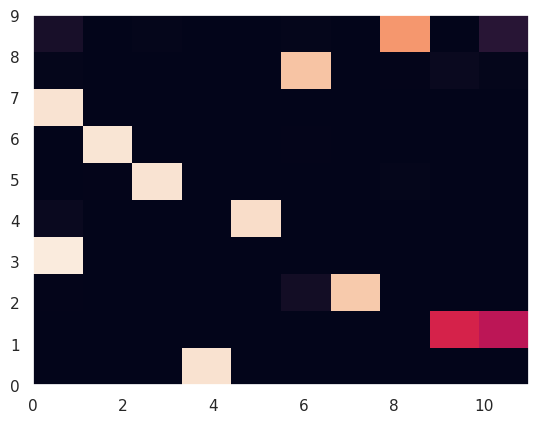

## coil, k=5

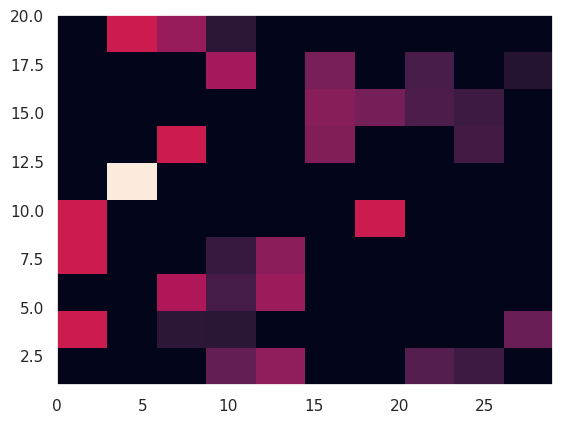

## mnist, k=10

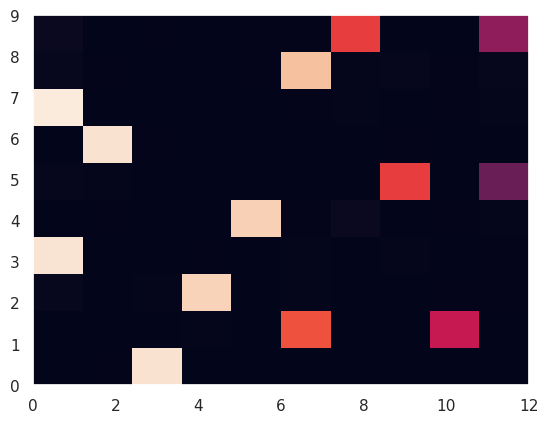

## usps, k=10

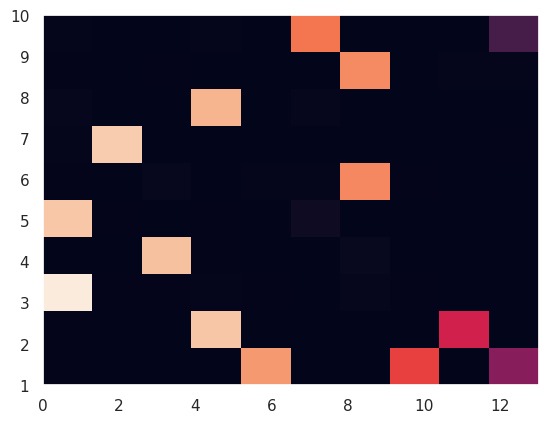

## buildings, k=8

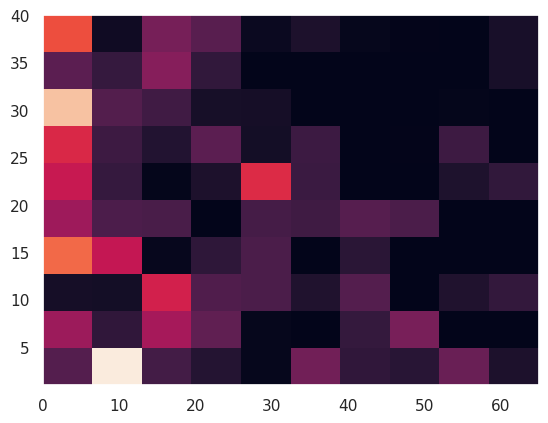

## clusterable, k=15

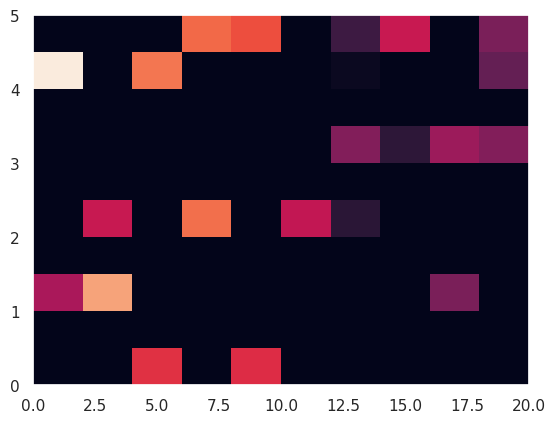

In [231]:
for i in range(6):
    correlation_hist(dataset_id=i)

## pendigits, k=15

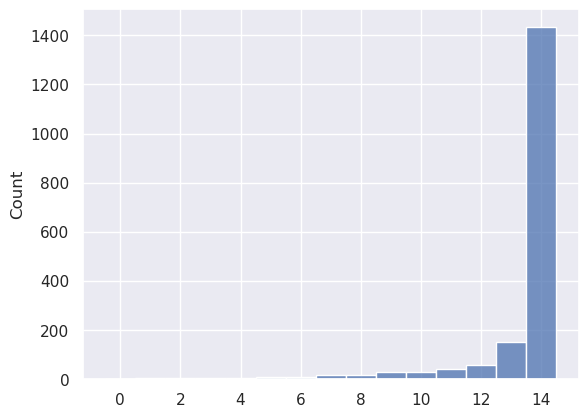

## coil, k=5

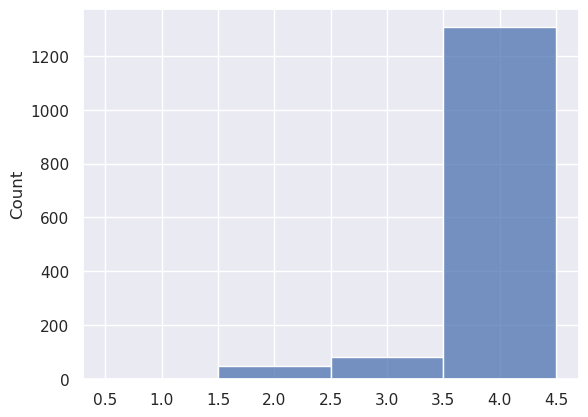

## mnist, k=10

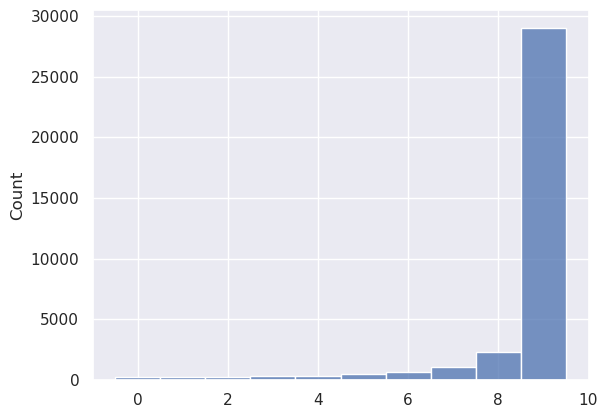

## usps, k=10

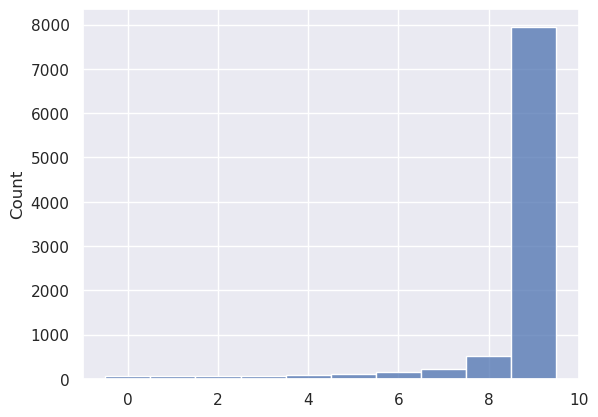

## buildings, k=8

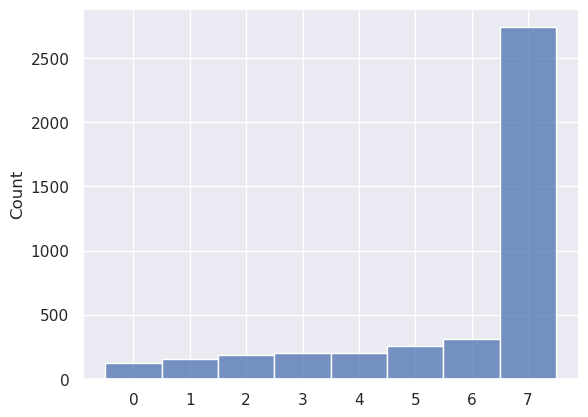

## clusterable, k=15

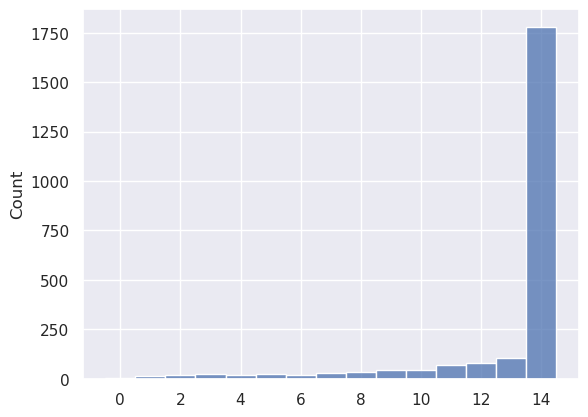

In [90]:
for i in range(6):
    internal_degree(dataset_id=i)